In [1]:
import torch
import torch.nn as nn
import tqdm.notebook as tq
import matplotlib.pyplot as plt

from torchvision import datasets, transforms
from PIL import Image
from skimage.color import rgb2lab, lab2rgb
import numpy as np

In [2]:
#check if gpu is available and if so move to gpu
if torch.cuda.is_available():
  device = torch.device("cuda:0")
  print("GPU")
else:
  device = torch.device("cpu")
  print("CPU")

GPU


In [3]:
#hyperparameter settings
epochs = 1000
n_test_images = 10
n_train_images = 2080 - n_test_images
batch_size = 6
n_test_images_used = 1

In [4]:
#data
torch.manual_seed(0)

def custom_pil_loader(path):
    with open(path, "rb") as f:
        img = np.array(Image.open(f))
        img = rgb2lab(img).transpose(2, 0, 1)
    
        normalized_img = np.zeros((3, 1200, 780))
        normalized_img[0] = img[0] * 255/100
        normalized_img[1] = img[1] + 128
        normalized_img[2] = img[2] + 128
        
        return Image.fromarray(np.uint8(normalized_img.transpose(1, 2, 0)))

transformation = transforms.Compose([transforms.ToTensor(), transforms.Resize((600, 390))])

dataset = datasets.ImageFolder("../input/op-dataset", loader=custom_pil_loader, transform=transformation)

train_dataset, test_dataset = torch.utils.data.random_split(dataset, [n_train_images, n_test_images])

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=n_test_images_used, shuffle=True)

In [5]:
#model
class critic(nn.Module):
    def __init__(self):
        super(critic, self).__init__()
        self.conv1 = nn.Sequential(
            # in: 3, 600, 390  (2, 600, 390 et 1, 600, 390)
            nn.Conv2d(3, 64, kernel_size=3, stride=2),
            nn.LeakyReLU(0.2, inplace=True)
            # out: 64, 299, 194
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=2),
            nn.InstanceNorm2d(128, affine=True),
            nn.LeakyReLU(0.2, inplace=True)
            # out: 128, 149, 97
        )
        self.conv3 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=2),
            nn.InstanceNorm2d(256, affine=True),
            nn.LeakyReLU(0.2, inplace=True)
            # out: 256, 74, 47
        )
        self.conv4 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, stride=2),
            nn.InstanceNorm2d(512, affine=True),
            nn.LeakyReLU(0.2, inplace=True)
            # out: 512, 36, 23
        )
        self.conv5 = nn.Sequential(
            nn.Conv2d(512, 1024, kernel_size=3, stride=2),
            nn.InstanceNorm2d(1024, affine=True),
            nn.LeakyReLU(0.2, inplace=True)
            # out: 1024, 17, 11
        )
        self.conv6 = nn.Sequential(
            nn.Conv2d(1024, 2048, kernel_size=3, stride=2),
            nn.InstanceNorm2d(2048, affine=True),
            nn.LeakyReLU(0.2, inplace=True)
            # out: 2048, 8, 5
        )
        self.layer7 = nn.Sequential(
            nn.Linear(2048*8*5, 64),
            nn.LeakyReLU(0.2, inplace=True)
            # out: 64
        )
        self.layer8 = nn.Sequential(
            nn.Linear(64, 32),
            nn.LeakyReLU(0.2, inplace=True)
            # out: 32
        )
        self.layer9 = nn.Sequential(
            nn.Linear(32, 1),
            # out: 1
        )

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)
        x = self.conv6(x)
        x = x.reshape(x.shape[0], x.shape[1] * x.shape[2] * x.shape[3])
        x = self.layer7(x)
        x = self.layer8(x)
        x = self.layer9(x)
        return x



class generator(nn.Module):
    def __init__(self):
        super(generator, self).__init__()
        self.conv1 = nn.Sequential(
            # in: 1, 600, 390
            nn.Conv2d(1, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True)
            # out: 64, 600, 390
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True)
            # out: 64, 600, 390
        )
        self.conv3 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True)
            # out: 128, 300, 195
        )
        self.conv4 = nn.Sequential(
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True)
            # out: 128, 300, 195
        )
        self.conv5 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True)
            # out: 256, 150, 98
        )
        self.conv6 = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True)
            # out: 256, 150, 98
        )
        self.conv7 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True)
            # out: 512, 75, 49
        )
        self.conv8 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True)
            # out: 512, 75, 49
        )
        self.conv9 = nn.Sequential(
            nn.Conv2d(512, 1024, kernel_size=3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True)
            # out: 1024, 38, 25
        )  
        self.conv10 = nn.Sequential(
            nn.Conv2d(1024, 1024, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True)
            # out: 1024, 38, 25
        )  
        self.conv11 = nn.Sequential(
            nn.Conv2d(1024, 1024*2, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True)
            # out: 1024*2, 38, 25
        )
        self.conv12 = nn.Sequential(
            nn.ConvTranspose2d(1024*2, 512*2, kernel_size=3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True)
            # out: 512*2, 75, 49
        )
        self.conv13 = nn.Sequential(
            nn.Conv2d(512*2 + 512, 512*2, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True)
            # out: 512*2, 75, 49
        )
        self.conv14 = nn.Sequential(
            nn.ConvTranspose2d(512*2, 256*2, kernel_size=3, stride=2, padding=1, output_padding=(1, 1)),
            nn.LeakyReLU(0.2, inplace=True)
            # out: 256*2, 150, 98
        )
        self.conv15 = nn.Sequential(
            nn.Conv2d(256*2 + 256, 256*2, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True)
            # out: 256*2, 150, 98
        )
        self.conv16 = nn.Sequential(
            nn.ConvTranspose2d(256*2, 128*2, kernel_size=3, stride=2, padding=1, output_padding=(1, 0)),
            nn.LeakyReLU(0.2, inplace=True)
            # out: 128*2, 300, 195
        )
        self.conv17 = nn.Sequential(
            nn.Conv2d(128*2 + 128, 128*2, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True)
            # out: 128*2, 300, 195
        )
        self.conv18 = nn.Sequential(
            nn.ConvTranspose2d(128*2, 64*2, kernel_size=3, stride=2, padding=1, output_padding=(1, 1)),
            nn.LeakyReLU(0.2, inplace=True)
            # out: 64*2, 600, 390
        )
        self.conv19 = nn.Sequential(
            nn.Conv2d(64*2 + 64, 64*2, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True)
            # out: 64*2, 600, 390
        )
        self.conv20 = nn.Sequential(
            nn.ConvTranspose2d(64*2, 2, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2, inplace=True)
            # out: 2, 600, 390
        )

    def forward(self, x):
        x = self.conv1(x)
        l2 = self.conv2(x)
        x = self.conv3(l2)
        l3 = self.conv4(x)
        x = self.conv5(l3)
        l4 = self.conv6(x)
        x = self.conv7(l4)
        l5 = self.conv8(x)
        x = self.conv9(l5)
        x = self.conv10(x)
        x = self.conv11(x)
        x = self.conv12(x)
        x = self.conv13(torch.cat((x, l5), 1))
        x = self.conv14(x)
        x = self.conv15(torch.cat((x, l4), 1))
        x = self.conv16(x)
        x = self.conv17(torch.cat((x, l3), 1))
        x = self.conv18(x)
        x = self.conv19(torch.cat((x, l2), 1))
        x = self.conv20(x)
        return x

In [6]:
def gradient_penalty(C, real_imgs, fake_imgs, device):
  batch_size, c, h, w = real_imgs.shape
  epsilon = torch.rand((batch_size, 1, 1, 1)).repeat(1, c, h, w).to(device)
  interpolated_imgs = real_imgs * epsilon + fake_imgs * (1-epsilon)

  #calculate critic scores
  mixed_scores = C(interpolated_imgs)

  gradient = torch.autograd.grad(
      inputs = interpolated_imgs,
      outputs = mixed_scores,
      grad_outputs = torch.ones_like(mixed_scores),
      create_graph = True,
      retain_graph = True,
  )[0]

  gradient = gradient.view(gradient.shape[0], -1)
  gradient_norm = gradient.norm(2, dim=1)
  gradient_penalty = torch.mean((gradient_norm -1)**2)

  return gradient_penalty

In [7]:
#load model
G = torch.load("../input/parameters/generator56.pt")
C = torch.load("../input/parameters/critic56.pt")

#load metrics
mesures = torch.load("../input/parameters/mesures56.pt")
C_loss_list = mesures[0].tolist()
G_loss_list = mesures[1].tolist()
train_MSE_list = mesures[2].tolist()
test_MSE_list = mesures[3].tolist()

In [8]:
#model
#G = generator().to(device)
#C = critic().to(device)

G_optimizer = torch.optim.Adam(G.parameters(), lr=0.00005, betas=(0.0, 0.9))
C_optimizer = torch.optim.Adam(C.parameters(), lr=0.00005, betas=(0.0, 0.9))

MSE = torch.nn.MSELoss()

#metrics
#C_loss_list = []
#G_loss_list = []
#train_MSE_list = []
#test_MSE_list = []

In [ ]:
#for parameter in C.parameters():
#    print(parameter.shape)

In [ ]:
#training loop
for epoch in tq.tqdm(range(56, epochs)):
    train_loader_iterator = iter(train_loader)
    
    for i in tq.tqdm(range(len(train_loader))):
        train_imgs, _ = next(train_loader_iterator)
        train_l_imgs = train_imgs[:, 0].reshape(train_imgs.shape[0], 1, 600, 390).to(device)
        train_ab_imgs = train_imgs[:, 1:].to(device)
        
        for j in range(5):
            # Training the critic
            real_inputs = torch.cat((train_ab_imgs, train_l_imgs), dim=1)
            real_outputs = C(real_inputs)

            fake_inputs = torch.cat((G(train_l_imgs), train_l_imgs), dim=1)
            fake_outputs = C(fake_inputs)

            gp = gradient_penalty(C, real_inputs, fake_inputs, device=device)

            C_loss = -(torch.mean(real_outputs) - torch.mean(fake_outputs)) + 10 * gp
            C.zero_grad()
            C_loss.backward()
            C_optimizer.step()


        # Training the generator
        fake_inputs = torch.cat((G(train_l_imgs), train_l_imgs), dim=1)
        fake_outputs = C(fake_inputs)

        G_loss = -torch.mean(fake_outputs)
        G.zero_grad()
        G_loss.backward()
        G_optimizer.step()



        if (i+1)%10 == 0:
            C_loss_list.append(-C_loss.item())
            G_loss_list.append(-G_loss.item())

            test_imgs, _ = next(iter(test_loader))
            test_l_imgs = test_imgs[:, 0].reshape(test_imgs.shape[0], 1, 600, 390).to(device)
            test_ab_imgs = test_imgs[:, 1:].to(device)

            #compute MSE on a train image and a test image
            train_MSE = MSE(G(train_l_imgs[0].reshape(1, 1, 600, 390)), train_ab_imgs[0].reshape(1, 2, 600, 390))
            test_MSE = MSE(G(test_l_imgs[0].reshape(1, 1, 600, 390)), test_ab_imgs[0].reshape(1, 2, 600, 390))
            train_MSE_list.append(train_MSE.item())
            test_MSE_list.append(test_MSE.item())



        if (i+1)%50 == 0:
                print(f'Epoch {epoch+1}   Iteration {i+1}/{len(train_loader)}   Discriminator loss {C_loss_list[-1]:.4f}   Generator loss {G_loss_list[-1]:.4f}   MSE train loss {train_MSE_list[-1]:.4f}   MSE test loss {test_MSE_list[-1]:.4f}')


                plt.figure(figsize=(20, 6))

                plt.subplot(1, 6, 1)
                plt.plot(C_loss_list, c="blue")

                plt.subplot(1, 6, 2)
                plt.plot(G_loss_list, c="red")

                plt.subplot(1, 6, 3)
                plt.plot(train_MSE_list, c="red")
                plt.plot(test_MSE_list, c="orange")

                plt.subplot(1, 6, 4)
                img = np.zeros((3, 600, 390))
                img[0] = dataset[0][0][0] * 255 * 100/255
                img[1] = dataset[0][0][1] * 255 - 128
                img[2] = dataset[0][0][2] * 255 - 128
                img = lab2rgb(img.transpose(1, 2, 0))
                plt.imshow(img)

                plt.subplot(1, 6, 5)
                plt.imshow(dataset[0][0][0].reshape(600, 390), cmap="gray")

                plt.subplot(1, 6, 6)
                output_img = G(dataset[0][0][0].reshape(1, 1, 600, 390).to(device)).reshape(2, 600, 390).detach().cpu()
                img = np.zeros((3, 600, 390))
                img[0] = dataset[0][0][0] * 255 * 100/255
                img[1] = output_img[0] * 255 - 128
                img[2] = output_img[1] * 255 - 128
                img = lab2rgb(img.transpose(1, 2, 0))
                plt.imshow(img)
                
                plt.pause(0.001)


    mesures_list = []
    mesures_list.append(C_loss_list)
    mesures_list.append(G_loss_list)
    mesures_list.append(train_MSE_list)
    mesures_list.append(test_MSE_list)
    mesures = torch.Tensor(mesures_list)
    
    torch.save(C, f"./critic{epoch+1}.pt")
    torch.save(G, f"./generator{epoch+1}.pt")
    torch.save(mesures, f"./mesures{epoch+1}.pt")
    
    print("paramètres enregistrés")

In [ ]:
from IPython.display import FileLink
#FileLink(r'./critic61.pt')
#FileLink(r'./generator61.pt')
FileLink(r'./mesures61.pt')

In [ ]:
print(torch.min(fake_inputs))
print(torch.mean(fake_inputs))
print(torch.max(fake_inputs))

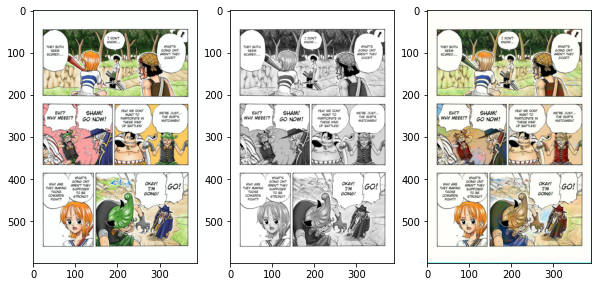

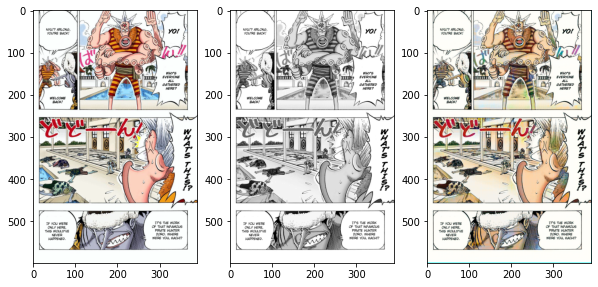

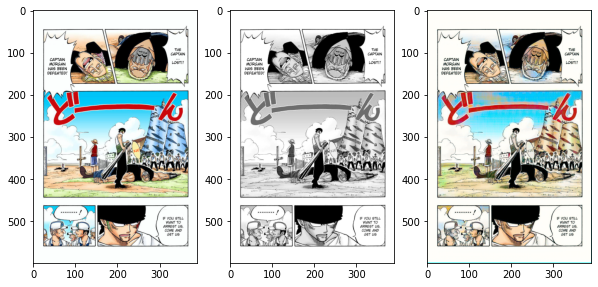

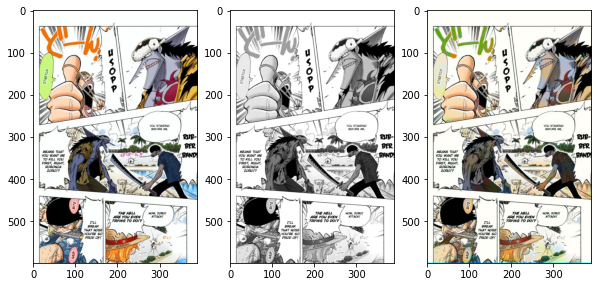

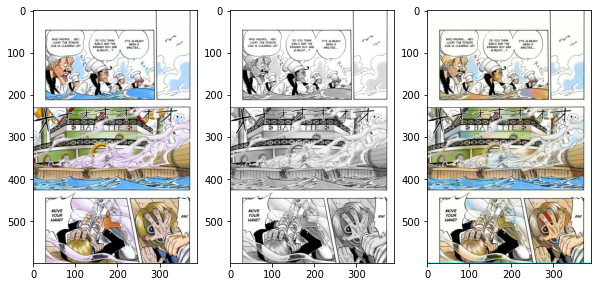

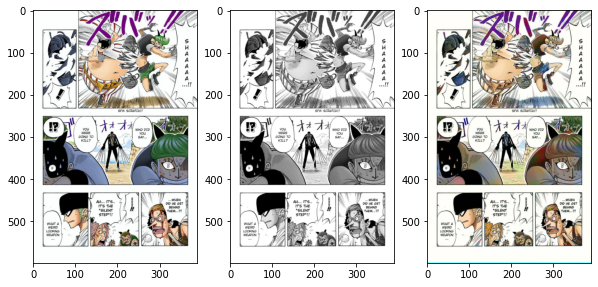

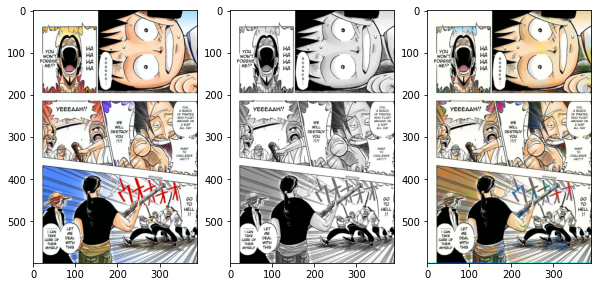

/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 2 pixels
  return func(*args, **kwargs)


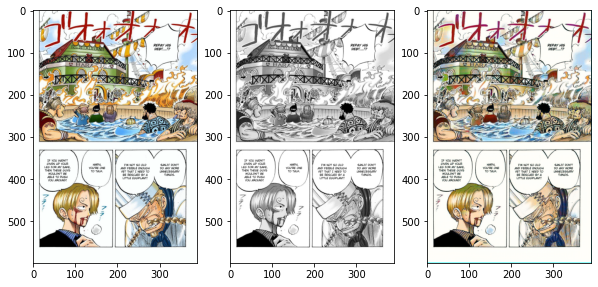

/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 8 pixels
  return func(*args, **kwargs)


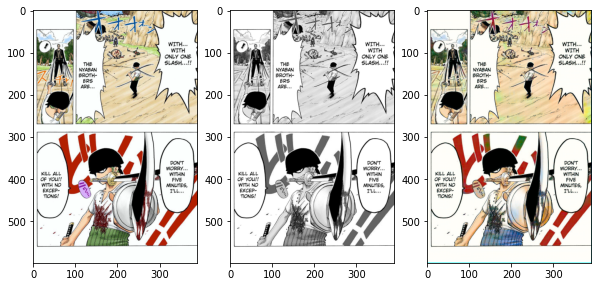

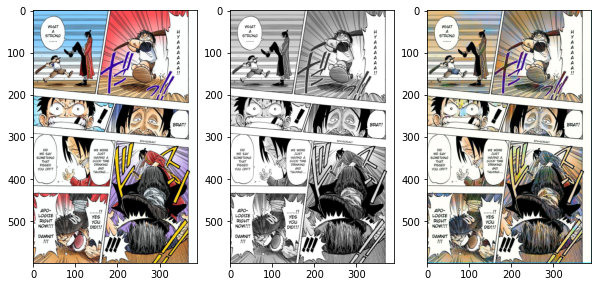

In [9]:
for i in range(10):

    plt.figure(figsize=(10, 6))

    plt.subplot(1, 3, 1)
    img = np.zeros((3, 600, 390))
    img[0] = test_dataset[i][0][0] * 255 * 100/255
    img[1] = test_dataset[i][0][1] * 255 - 128
    img[2] = test_dataset[i][0][2] * 255 - 128
    img = lab2rgb(img.transpose(1, 2, 0))
    plt.imshow(img)
    
    plt.subplot(1, 3, 2)
    plt.imshow(test_dataset[i][0][0].reshape(600, 390), cmap="gray")
                
    plt.subplot(1, 3, 3)
    output_img = G(test_dataset[i][0][0].reshape(1, 1, 600, 390).to(device)).reshape(2, 600, 390).detach().cpu()
    img = np.zeros((3, 600, 390))
    img[0] = test_dataset[i][0][0] * 255 * 100/255
    img[1] = output_img[0] * 255 - 128
    img[2] = output_img[1] * 255 - 128
    img = lab2rgb(img.transpose(1, 2, 0))
    plt.imshow(img)
    
    plt.show()

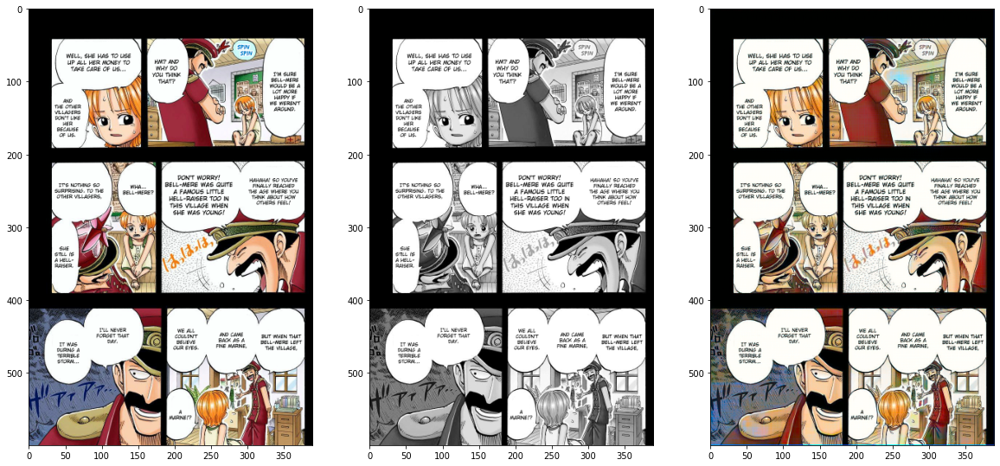

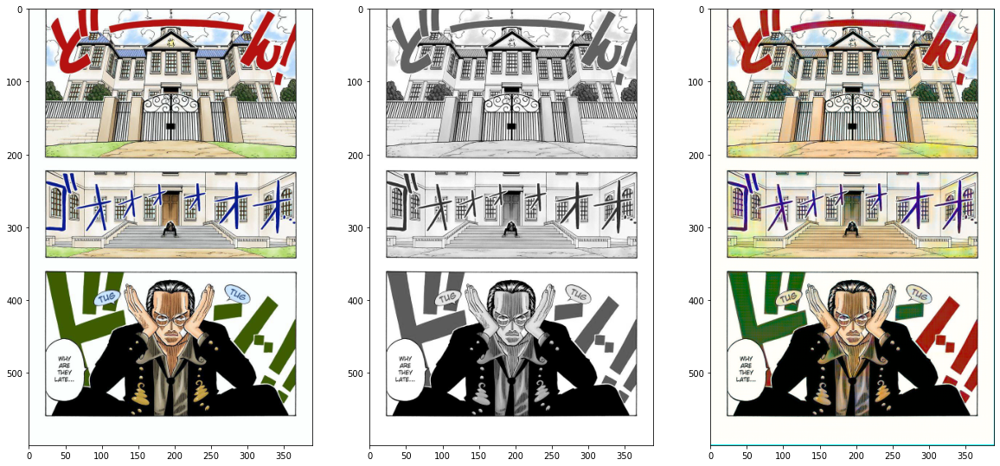

/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 1 pixels
  return func(*args, **kwargs)


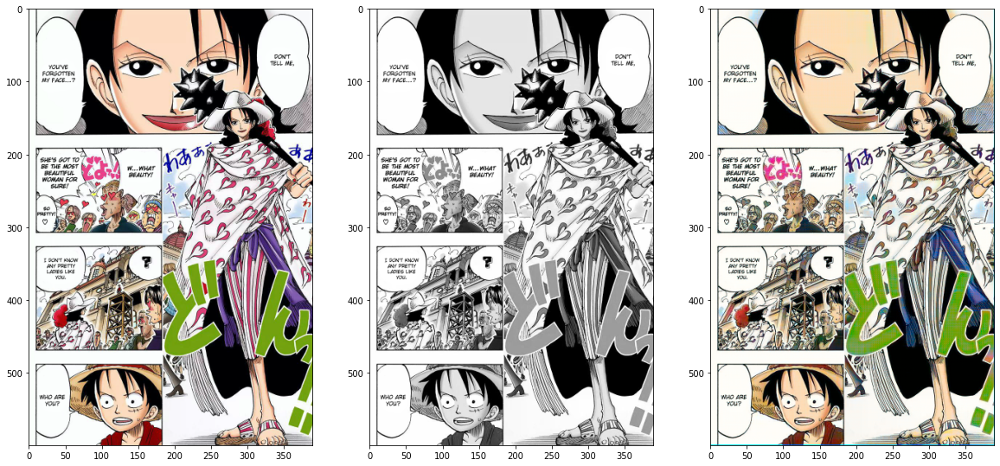

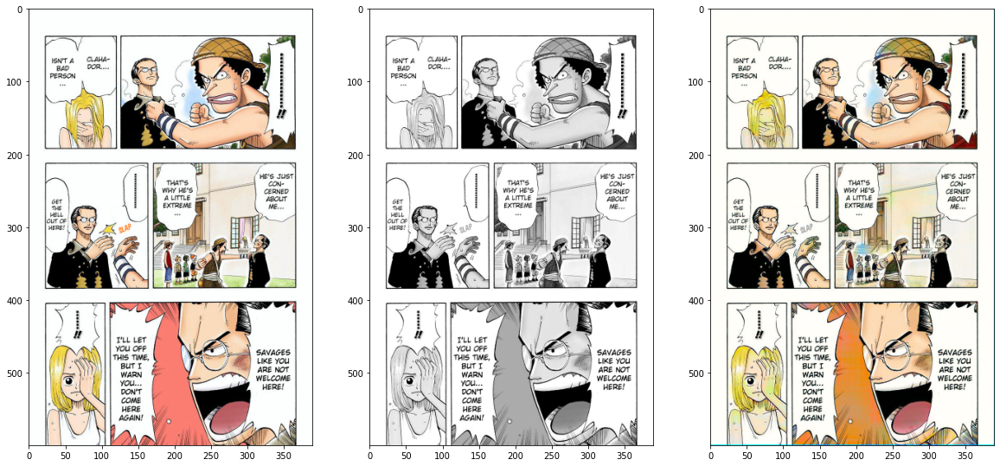

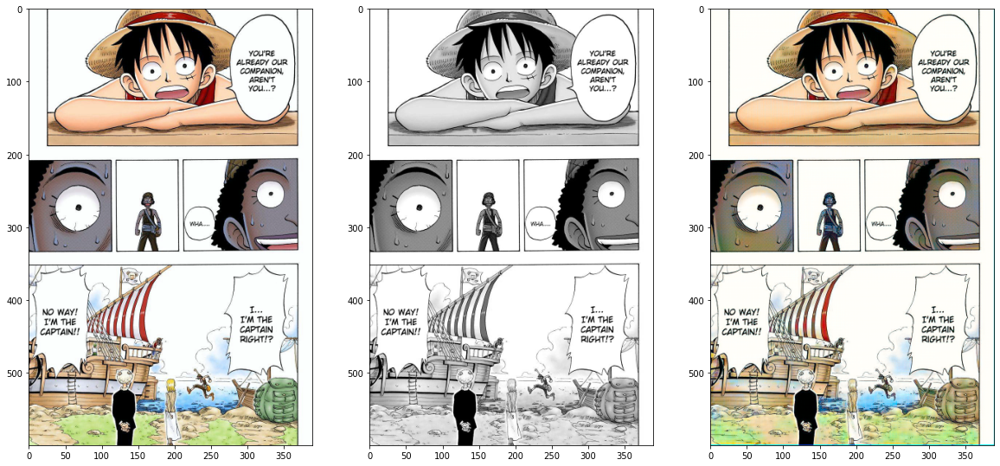

/opt/conda/lib/python3.7/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 27 pixels
  return func(*args, **kwargs)


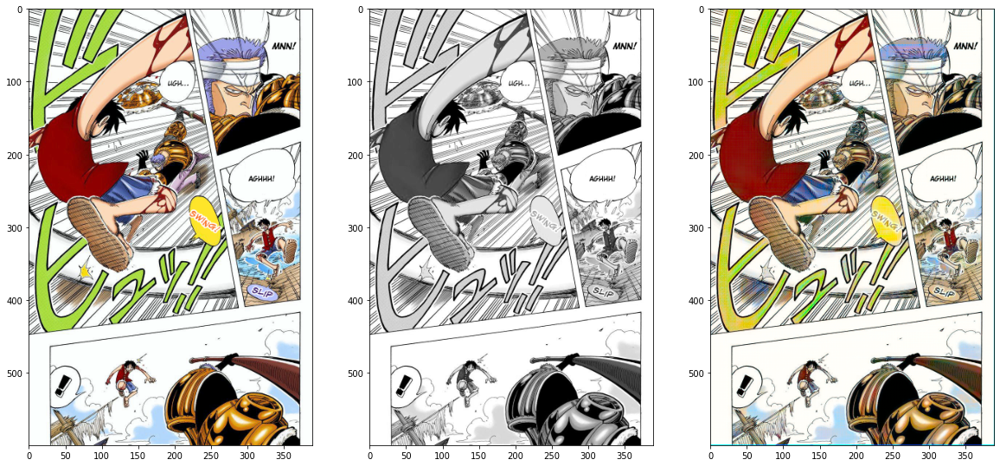

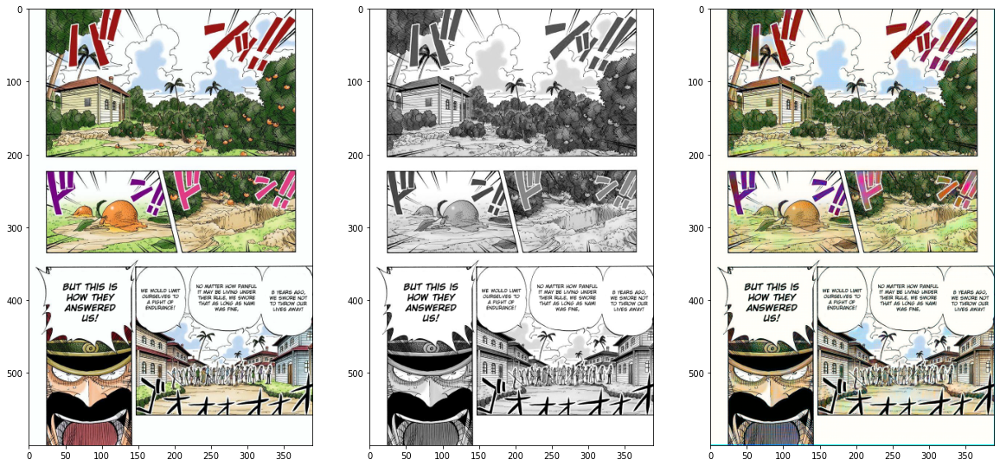

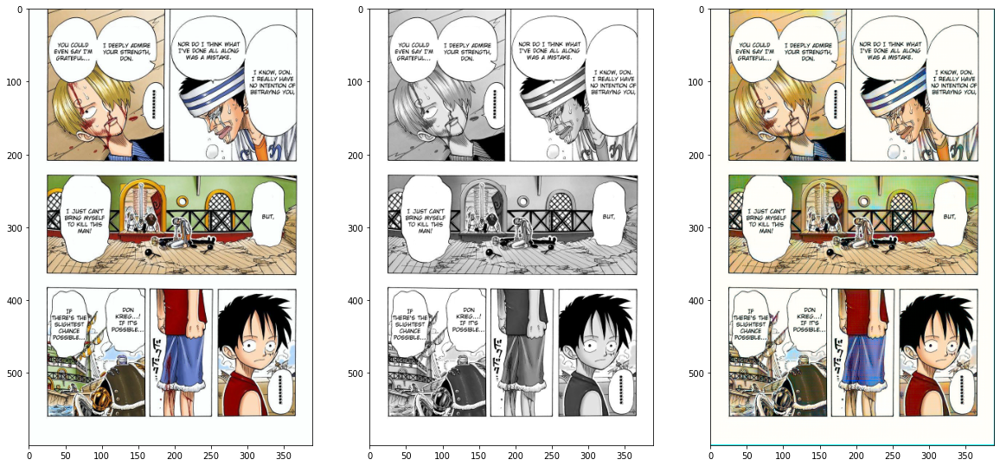

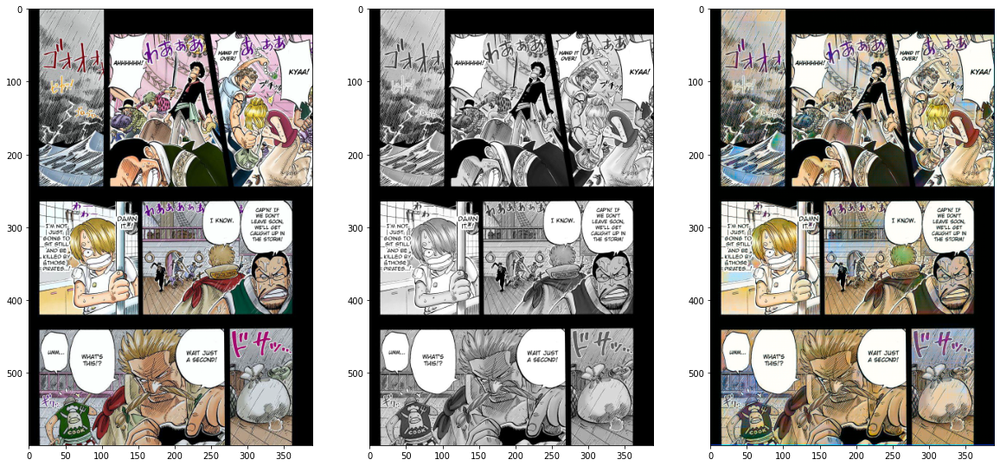

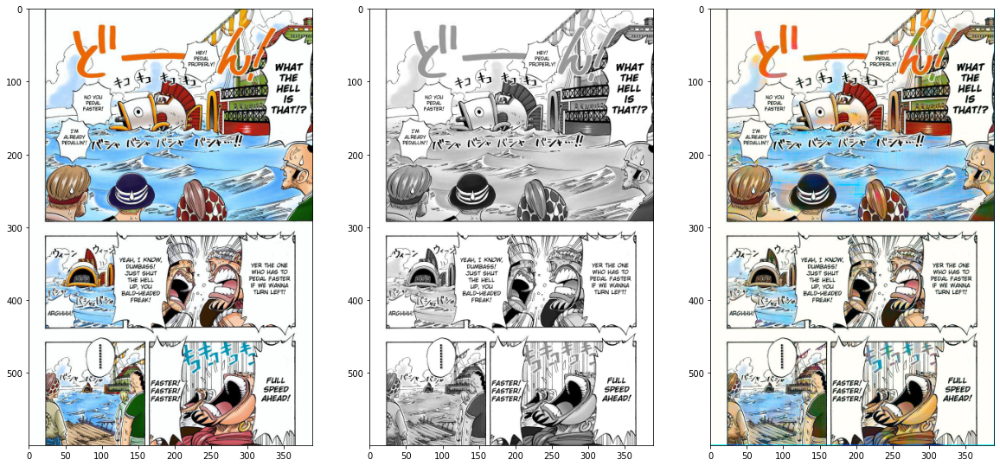

In [10]:
for i in range(50, 60):

    plt.figure(figsize=(20, 10))

    plt.subplot(1, 3, 1)
    img = np.zeros((3, 600, 390))
    img[0] = train_dataset[i][0][0] * 255 * 100/255
    img[1] = train_dataset[i][0][1] * 255 - 128
    img[2] = train_dataset[i][0][2] * 255 - 128
    img = lab2rgb(img.transpose(1, 2, 0))
    plt.imshow(img)
    
    plt.subplot(1, 3, 2)
    plt.imshow(train_dataset[i][0][0].reshape(600, 390), cmap="gray")
                
    plt.subplot(1, 3, 3)
    output_img = G(train_dataset[i][0][0].reshape(1, 1, 600, 390).to(device)).reshape(2, 600, 390).detach().cpu()
    img = np.zeros((3, 600, 390))
    img[0] = train_dataset[i][0][0] * 255 * 100/255
    img[1] = output_img[0] * 255 - 128
    img[2] = output_img[1] * 255 - 128
    img = lab2rgb(img.transpose(1, 2, 0))
    plt.imshow(img)
    
    plt.show()